Check PyTorch/GPU


In [1]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("GPU not available. Enable GPU from Runtime → Change runtime type.")

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


Check existing libraries

In [5]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

print("OpenCV:", cv2.__version__)
print("NumPy:", np.__version__)
print("Pandas:", pd.__version__)

OpenCV: 4.14.0
NumPy: 2.3.3
Pandas: 2.3.3


Download MVTec AD

In [4]:
!wget -q --show-progress \
"https://www.kaggle.com/api/v1/datasets/download/ipythonx/mvtec-ad" \
-O /content/mvtec.zip

/content/mvtec.zip  100%[===================>]   4.91G  20.4MB/s    in 4m 19s  


Verify download

In [6]:
import os

file_path = "/content/mvtec.zip"

if os.path.exists(file_path):
    size_mb = os.path.getsize(file_path) / (1024 ** 2)

    print("Dataset downloaded successfully!")
    print(f"File size: {size_mb:.2f} MB")
else:
    print("Dataset download failed.")

Dataset downloaded successfully!
File size: 5024.81 MB


Inspect ZIP contents

In [7]:
import zipfile

zip_path = "/content/mvtec.zip"

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    files = zip_ref.namelist()

print("Total files:", len(files))

for file in files[:30]:
    print(file)

Total files: 6644
bottle/ground_truth/broken_large/000_mask.png
bottle/ground_truth/broken_large/001_mask.png
bottle/ground_truth/broken_large/002_mask.png
bottle/ground_truth/broken_large/003_mask.png
bottle/ground_truth/broken_large/004_mask.png
bottle/ground_truth/broken_large/005_mask.png
bottle/ground_truth/broken_large/006_mask.png
bottle/ground_truth/broken_large/007_mask.png
bottle/ground_truth/broken_large/008_mask.png
bottle/ground_truth/broken_large/009_mask.png
bottle/ground_truth/broken_large/010_mask.png
bottle/ground_truth/broken_large/011_mask.png
bottle/ground_truth/broken_large/012_mask.png
bottle/ground_truth/broken_large/013_mask.png
bottle/ground_truth/broken_large/014_mask.png
bottle/ground_truth/broken_large/015_mask.png
bottle/ground_truth/broken_large/016_mask.png
bottle/ground_truth/broken_large/017_mask.png
bottle/ground_truth/broken_large/018_mask.png
bottle/ground_truth/broken_large/019_mask.png
bottle/ground_truth/broken_small/000_mask.png
bottle/ground_tr

Extract the dataset

In [8]:
import zipfile
import os

extract_dir = "/content/mvtec_data"

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)

print("Extraction completed.")

Extraction completed.


Find the dataset structure

In [9]:
for root, dirs, files in os.walk(extract_dir):

    level = root.replace(extract_dir, "").count(os.sep)

    if level <= 2:
        print("  " * level + os.path.basename(root) + "/")

mvtec_data/
  grid/
    test/
    ground_truth/
    train/
  metal_nut/
    test/
    ground_truth/
    train/
  carpet/
    test/
    ground_truth/
    train/
  screw/
    test/
    ground_truth/
    train/
  zipper/
    test/
    ground_truth/
    train/
  pill/
    test/
    ground_truth/
    train/
  toothbrush/
    test/
    ground_truth/
    train/
  transistor/
    test/
    ground_truth/
    train/
  hazelnut/
    test/
    ground_truth/
    train/
  bottle/
    test/
    ground_truth/
    train/
  wood/
    test/
    ground_truth/
    train/
  tile/
    test/
    ground_truth/
    train/
  cable/
    test/
    ground_truth/
    train/
  leather/
    test/
    ground_truth/
    train/
  capsule/
    test/
    ground_truth/
    train/


Automatically find metal_nut

In [10]:
metal_nut_path = None

for root, dirs, files in os.walk(extract_dir):

    if os.path.basename(root) == "metal_nut":
        metal_nut_path = root
        break

print("metal_nut path:")
print(metal_nut_path)

metal_nut path:
/content/mvtec_data/metal_nut


Explore metal_nut

In [11]:
print("Contents of metal_nut:")

for item in os.listdir(metal_nut_path):
    print("-", item)

Contents of metal_nut:
- test
- ground_truth
- license.txt
- train
- readme.txt


Explore training data

In [12]:
train_path = os.path.join(
    metal_nut_path,
    "train"
)

print("Training folders:")

for item in os.listdir(train_path):
    print("-", item)

Training folders:
- good


Load normal images

In [13]:
good_train_path = os.path.join(
    train_path,
    "good"
)

train_images = []

for filename in os.listdir(good_train_path):

    if filename.lower().endswith(
        (".png", ".jpg", ".jpeg")
    ):
        train_images.append(
            os.path.join(good_train_path, filename)
        )

print("Number of normal training images:", len(train_images))

Number of normal training images: 220


Display one image

Image size: (700, 700)
Image mode: RGB


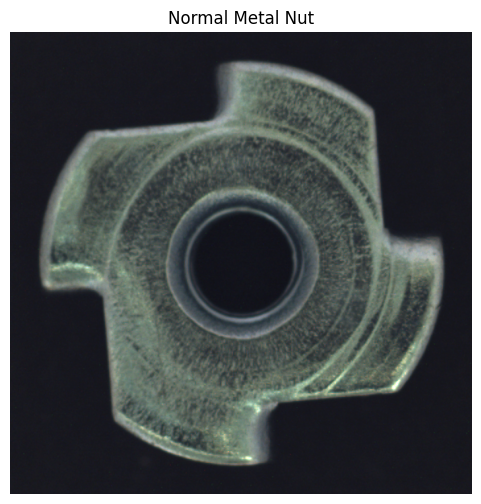

In [14]:
image_path = train_images[0]

image = Image.open(image_path)

print("Image size:", image.size)
print("Image mode:", image.mode)

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Normal Metal Nut")
plt.show()

Display multiple images

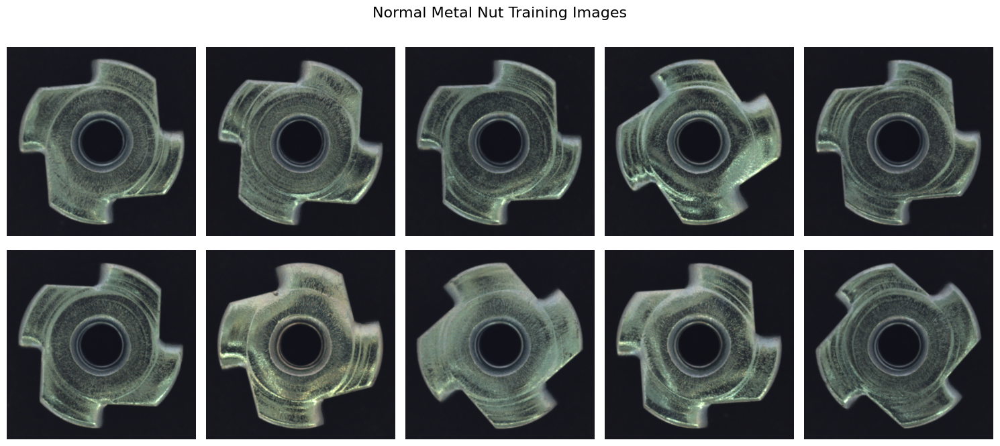

In [15]:
fig, axes = plt.subplots(
    2,
    5,
    figsize=(15, 7)
)

for ax, image_path in zip(
    axes.flatten(),
    train_images[:10]
):

    image = Image.open(image_path)

    ax.imshow(image)
    ax.axis("off")

plt.suptitle(
    "Normal Metal Nut Training Images",
    fontsize=16
)

plt.tight_layout()
plt.show()

Explore defective images

In [16]:
test_path = os.path.join(
    metal_nut_path,
    "test"
)

test_categories = [
    item
    for item in os.listdir(test_path)
    if os.path.isdir(
        os.path.join(test_path, item)
    )
]

print("Test categories:")

for category in test_categories:
    print("-", category)

Test categories:
- color
- flip
- scratch
- bent
- good


Count images

In [17]:
defect_counts = {}

for category in test_categories:

    category_path = os.path.join(
        test_path,
        category
    )

    images = [
        f
        for f in os.listdir(category_path)
        if f.lower().endswith(
            (".png", ".jpg", ".jpeg")
        )
    ]

    defect_counts[category] = len(images)

print(defect_counts)

{'color': 22, 'flip': 23, 'scratch': 23, 'bent': 25, 'good': 22}


Plot distribution

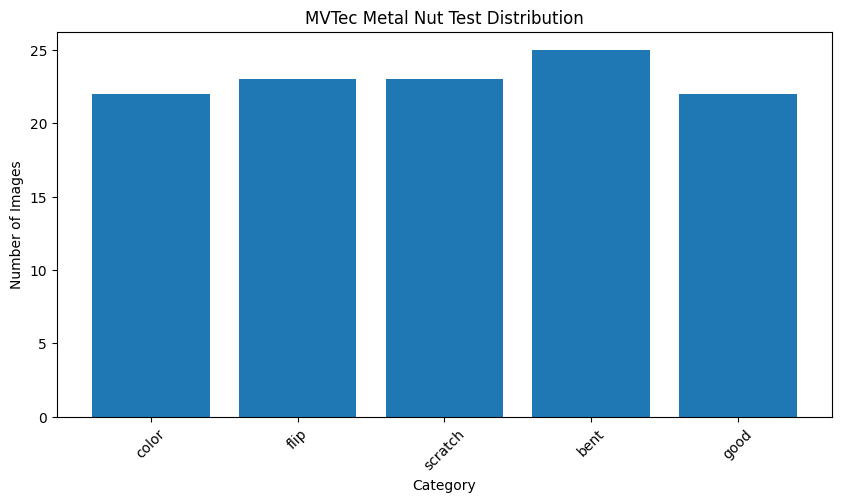

In [18]:
plt.figure(figsize=(10, 5))

plt.bar(
    defect_counts.keys(),
    defect_counts.values()
)

plt.xlabel("Category")
plt.ylabel("Number of Images")
plt.title("MVTec Metal Nut Test Distribution")

plt.xticks(rotation=45)

plt.show()

Visualize defects

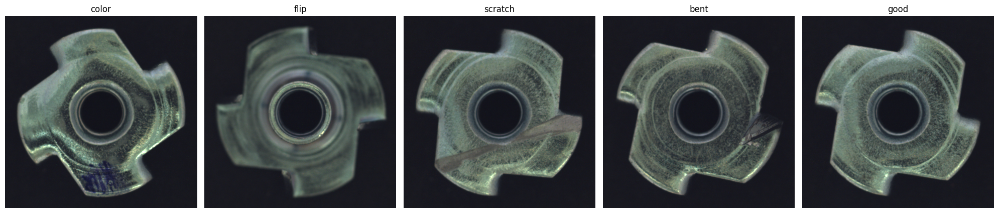

In [19]:
fig, axes = plt.subplots(
    1,
    len(test_categories),
    figsize=(20, 5)
)

for ax, category in zip(
    axes,
    test_categories
):

    category_path = os.path.join(
        test_path,
        category
    )

    images = [
        f
        for f in os.listdir(category_path)
        if f.lower().endswith(
            (".png", ".jpg", ".jpeg")
        )
    ]

    if not images:
        continue

    image_path = os.path.join(
        category_path,
        images[0]
    )

    image = Image.open(image_path)

    ax.imshow(image)
    ax.set_title(category)
    ax.axis("off")

plt.tight_layout()
plt.show()

Create our classification dataframe

In [20]:
records = []

# Normal training images
for image_path in train_images:

    records.append({
        "image_path": image_path,
        "category": "good",
        "label": 0,
        "split": "train"
    })


# Test images
for category in test_categories:

    category_path = os.path.join(
        test_path,
        category
    )

    for filename in os.listdir(category_path):

        if filename.lower().endswith(
            (".png", ".jpg", ".jpeg")
        ):

            records.append({
                "image_path": os.path.join(
                    category_path,
                    filename
                ),
                "category": category,
                "label": 0 if category == "good" else 1,
                "split": "test"
            })


df = pd.DataFrame(records)

print("Dataset shape:", df.shape)

df.head()

Dataset shape: (335, 4)


,image_path,category,label,split
0,/content/mvtec_data/metal_nut/train/good/140.png,good,0,train
1,/content/mvtec_data/metal_nut/train/good/171.png,good,0,train
2,/content/mvtec_data/metal_nut/train/good/081.png,good,0,train
3,/content/mvtec_data/metal_nut/train/good/066.png,good,0,train
4,/content/mvtec_data/metal_nut/train/good/034.png,good,0,train


Check labels

In [21]:
print("Category distribution:")
print(df["category"].value_counts())

print("\nBinary classification:")
print(df["label"].value_counts())

Category distribution:
category
good       242
bent        25
flip        23
scratch     23
color       22
Name: count, dtype: int64

Binary classification:
label
0    242
1     93
Name: count, dtype: int64


Create our own train/validation/test split

In [22]:
from sklearn.model_selection import train_test_split

# Use all available records
train_df, temp_df = train_test_split(
    df,
    test_size=0.30,
    stratify=df["label"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    stratify=temp_df["label"],
    random_state=42
)

print("Train:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))

Train: 234
Validation: 50
Test: 51


Image preprocessing

In [23]:
IMG_SIZE = 224

def load_image(image_path):

    image = cv2.imread(image_path)

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    image = cv2.resize(
        image,
        (IMG_SIZE, IMG_SIZE)
    )

    return image

Test preprocessing

Shape: (224, 224, 3)
Data type: uint8


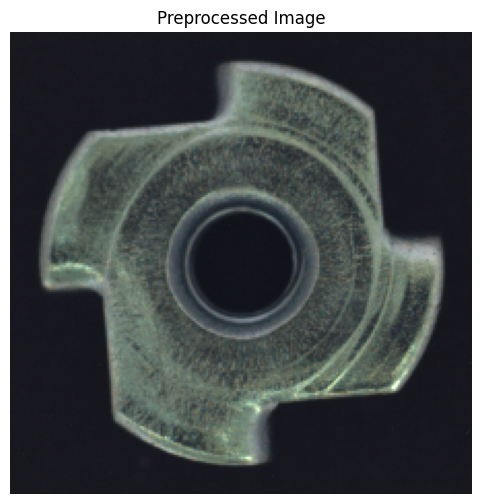

In [24]:
sample_path = df.iloc[0]["image_path"]

sample_image = load_image(sample_path)

print("Shape:", sample_image.shape)
print("Data type:", sample_image.dtype)

plt.figure(figsize=(6, 6))

plt.imshow(sample_image)

plt.axis("off")
plt.title("Preprocessed Image")

plt.show()

Data augmentation

In [25]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.ToPILImage(),

    transforms.Resize(
        (224, 224)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


val_transform = transforms.Compose([
    transforms.ToPILImage(),

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

Test augmentation

In [26]:
image = load_image(sample_path)

augmented_image = train_transform(image)

print("Tensor shape:")
print(augmented_image.shape)

Tensor shape:
torch.Size([3, 224, 224])


CNN BASELINE

In [27]:
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader

from torchvision import models, transforms

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)

print("PyTorch components loaded.")

PyTorch components loaded.


Create PyTorch Dataset

In [28]:
class MetalNutDataset(Dataset):

    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):

        row = self.dataframe.iloc[index]

        image_path = row["image_path"]
        label = int(row["label"])

        image = cv2.imread(image_path)

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

Create datasets

In [29]:
train_dataset = MetalNutDataset(
    train_df,
    transform=train_transform
)

val_dataset = MetalNutDataset(
    val_df,
    transform=val_transform
)

test_dataset = MetalNutDataset(
    test_df,
    transform=val_transform
)

print("Train:", len(train_dataset))
print("Validation:", len(val_dataset))
print("Test:", len(test_dataset))

Train: 234
Validation: 50
Test: 51


Create DataLoaders

In [30]:
BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("DataLoaders created.")

DataLoaders created.


RESNET18

In [31]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Using device:", device)

model = models.resnet18(
    weights=models.ResNet18_Weights.DEFAULT
)

model.fc = nn.Linear(
    model.fc.in_features,
    2
)

model = model.to(device)

print(model.fc)

Using device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 120MB/s]


Linear(in_features=512, out_features=2, bias=True)


Loss and optimizer

In [32]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.parameters(),
    lr=1e-4
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    patience=2,
    factor=0.5
)

print("Loss, optimizer and scheduler ready.")

Loss, optimizer and scheduler ready.


TRAINING

In [33]:
def train_one_epoch(model, loader, criterion, optimizer):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += (
            loss.item() * images.size(0)
        )

        _, predictions = torch.max(
            outputs,
            1
        )

        total += labels.size(0)

        correct += (
            predictions == labels
        ).sum().item()

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [36]:
import os

# Main project directory
PROJECT_DIR = "/content/ai_visual_quality_inspection"

# Create required folders
os.makedirs(PROJECT_DIR, exist_ok=True)
os.makedirs(
    f"{PROJECT_DIR}/models",
    exist_ok=True
)
os.makedirs(
    f"{PROJECT_DIR}/results",
    exist_ok=True)

print("PROJECT_DIR:", PROJECT_DIR)
print("Models folder created.")
print("Results folder created.")

PROJECT_DIR: /content/ai_visual_quality_inspection
Models folder created.
Results folder created.


In [34]:
def validate(model, loader, criterion):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_labels = []
    all_predictions = []

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += (
                loss.item() * images.size(0)
            )

            _, predictions = torch.max(
                outputs,
                1
            )

            total += labels.size(0)

            correct += (
                predictions == labels
            ).sum().item()

            all_labels.extend(
                labels.cpu().numpy()
            )

            all_predictions.extend(
                predictions.cpu().numpy()
            )

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return (
        epoch_loss,
        epoch_accuracy,
        all_labels,
        all_predictions
    )

Train model

In [37]:
EPOCHS = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": []
}

best_val_loss = float("inf")

for epoch in range(EPOCHS):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc, _, _ = validate(
        model,
        val_loader,
        criterion
    )

    scheduler.step(val_loss)

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Train Acc: {train_acc:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Val Acc: {val_acc:.4f}"
    )

    if val_loss < best_val_loss:

        best_val_loss = val_loss

        torch.save(
            model.state_dict(),
            f"{PROJECT_DIR}/models/resnet18_best.pth"
        )

print("Training completed.")
print(
    "Best model saved at:",
    f"{PROJECT_DIR}/models/resnet18_best.pth"
)

Epoch [1/10] Train Loss: 0.2113 Train Acc: 0.9060 Val Loss: 0.3571 Val Acc: 0.8200
Epoch [2/10] Train Loss: 0.1555 Train Acc: 0.9402 Val Loss: 0.1942 Val Acc: 0.9200
Epoch [3/10] Train Loss: 0.1475 Train Acc: 0.9444 Val Loss: 0.2142 Val Acc: 0.9400
Epoch [4/10] Train Loss: 0.0364 Train Acc: 0.9957 Val Loss: 0.1047 Val Acc: 0.9200
Epoch [5/10] Train Loss: 0.0528 Train Acc: 0.9829 Val Loss: 0.0718 Val Acc: 0.9600
Epoch [6/10] Train Loss: 0.0177 Train Acc: 1.0000 Val Loss: 0.0986 Val Acc: 0.9600
Epoch [7/10] Train Loss: 0.1087 Train Acc: 0.9615 Val Loss: 0.0069 Val Acc: 1.0000
Epoch [8/10] Train Loss: 0.0262 Train Acc: 0.9957 Val Loss: 0.1390 Val Acc: 0.9400
Epoch [9/10] Train Loss: 0.0417 Train Acc: 0.9829 Val Loss: 0.0076 Val Acc: 1.0000
Epoch [10/10] Train Loss: 0.0097 Train Acc: 1.0000 Val Loss: 0.0221 Val Acc: 1.0000
Training completed.
Best model saved at: /content/ai_visual_quality_inspection/models/resnet18_best.pth


TRAINING CURVES

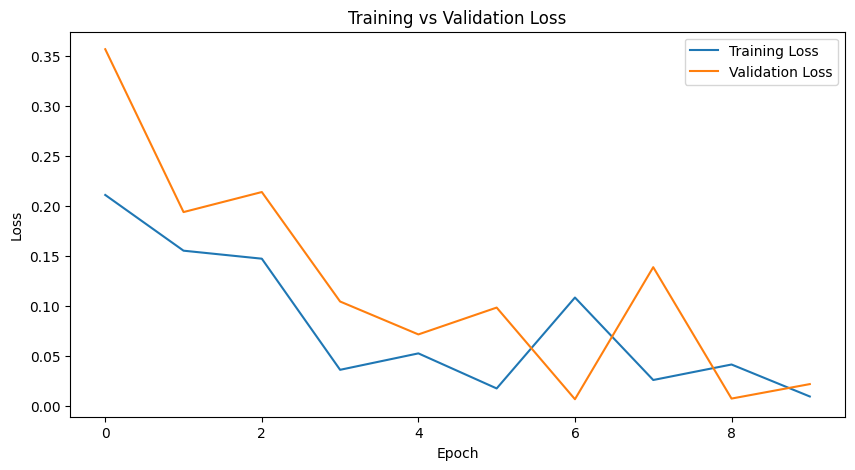

In [38]:
plt.figure(figsize=(10, 5))

plt.plot(
    history["train_loss"],
    label="Training Loss"
)

plt.plot(
    history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()

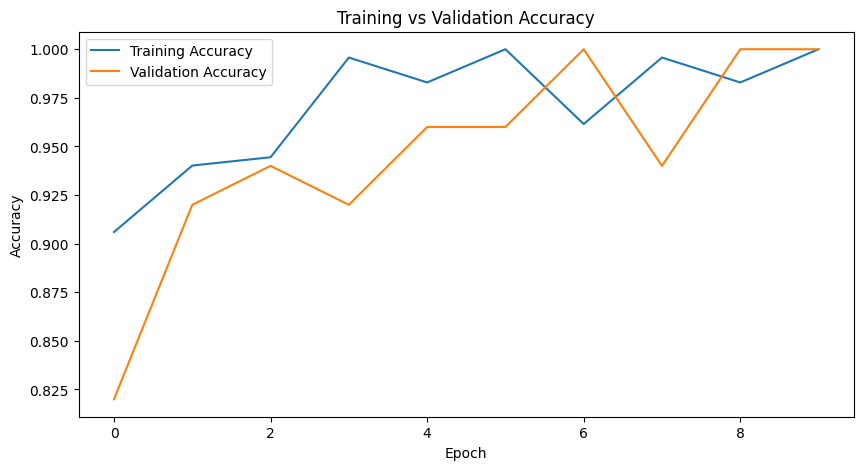

In [39]:
plt.figure(figsize=(10, 5))

plt.plot(
    history["train_acc"],
    label="Training Accuracy"
)

plt.plot(
    history["val_acc"],
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.show()

MODEL EVALUATION

In [40]:
model.load_state_dict(
    torch.load(
        f"{PROJECT_DIR}/models/resnet18_best.pth",
        map_location=device
    )
)

model.eval()

print("Best model loaded.")

Best model loaded.


Test model

In [41]:
test_loss, test_acc, y_true, y_pred = validate(
    model,
    test_loader,
    criterion
)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

Test Loss: 0.13340195399873397
Test Accuracy: 0.9607843137254902


Classification metrics

In [42]:
accuracy = accuracy_score(
    y_true,
    y_pred
)

precision = precision_score(
    y_true,
    y_pred,
    zero_division=0
)

recall = recall_score(
    y_true,
    y_pred,
    zero_division=0
)

f1 = f1_score(
    y_true,
    y_pred,
    zero_division=0
)

print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

Accuracy : 0.9608
Precision: 1.0000
Recall   : 0.8571
F1 Score : 0.9231


Classification report

In [43]:
print(
    classification_report(
        y_true,
        y_pred,
        target_names=[
            "Good",
            "Defective"
        ],
        zero_division=0
    )
)

              precision    recall  f1-score   support

        Good       0.95      1.00      0.97        37
   Defective       1.00      0.86      0.92        14

    accuracy                           0.96        51
   macro avg       0.97      0.93      0.95        51
weighted avg       0.96      0.96      0.96        51



Confusion matrix

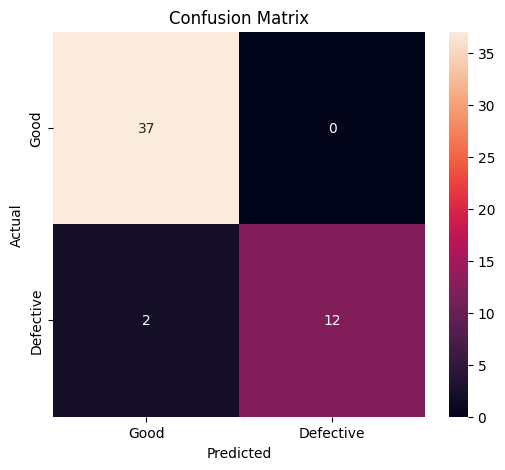

In [44]:
cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=["Good", "Defective"],
    yticklabels=["Good", "Defective"]
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.show()

SINGLE IMAGE PREDICTION

In [45]:
def predict_image(
    image_path,
    model
):

    image = cv2.imread(image_path)

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    tensor = val_transform(
        image_rgb
    ).unsqueeze(0).to(device)

    model.eval()

    with torch.no_grad():

        outputs = model(tensor)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        prediction = torch.argmax(
            probabilities,
            dim=1
        ).item()

    confidence = probabilities[
        0,
        prediction
    ].item()

    label = (
        "DEFECTIVE"
        if prediction == 1
        else "GOOD"
    )

    return label, confidence

Test prediction

Prediction: DEFECTIVE
Confidence: 100.00%


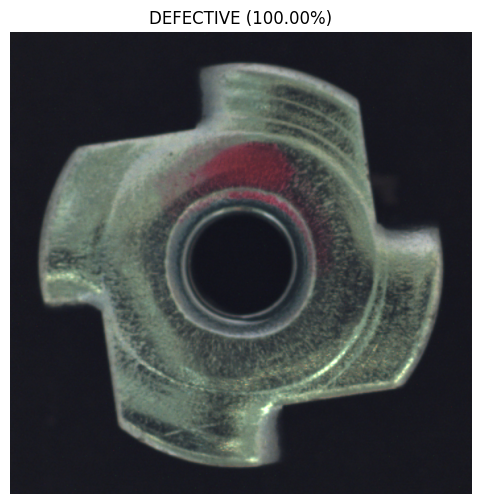

In [46]:
sample_path = test_df.iloc[0]["image_path"]

label, confidence = predict_image(
    sample_path,
    model
)

print("Prediction:", label)
print(f"Confidence: {confidence:.2%}")

image = Image.open(sample_path)

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")
plt.title(
    f"{label} ({confidence:.2%})"
)
plt.show()

GRAD-CAM

In [47]:
!pip install -q grad-cam

Import Grad-CAM

In [48]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Grad-CAM loaded.")

Grad-CAM loaded.


Prepare Grad-CAM

In [49]:
target_layers = [
    model.layer4[-1]
]

cam = GradCAM(
    model=model,
    target_layers=target_layers
)

print("Grad-CAM ready.")

Grad-CAM ready.


Generate heatmap

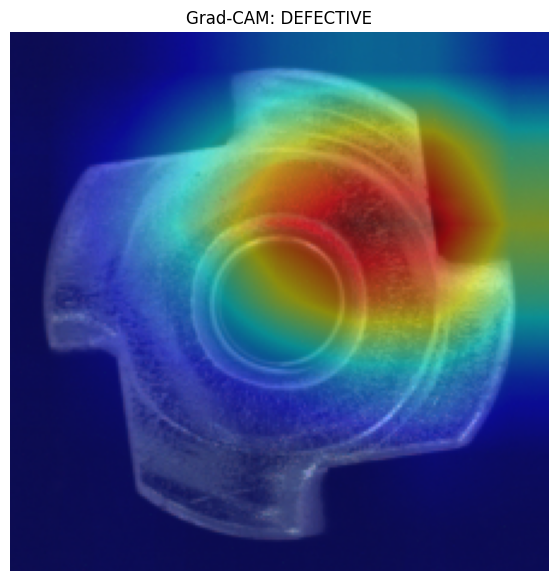

In [50]:
image = cv2.imread(sample_path)

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

resized = cv2.resize(
    image_rgb,
    (224, 224)
)

input_tensor = val_transform(
    image_rgb
).unsqueeze(0).to(device)

model.eval()

with torch.no_grad():

    output = model(
        input_tensor
    )

predicted_class = torch.argmax(
    output,
    dim=1
).item()

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=[
        ClassifierOutputTarget(
            predicted_class
        )
    ]
)[0]

rgb_float = resized.astype(
    np.float32
) / 255.0

visualization = show_cam_on_image(
    rgb_float,
    grayscale_cam,
    use_rgb=True
)

plt.figure(figsize=(7, 7))
plt.imshow(visualization)
plt.axis("off")
plt.title(
    f"Grad-CAM: "
    f"{'DEFECTIVE' if predicted_class else 'GOOD'}"
)
plt.show()

CREATE YOLO DATA FROM MVTec MASKS
Find ground-truth directory

In [51]:
ground_truth_path = os.path.join(
    metal_nut_path,
    "ground_truth"
)

print("Ground truth path:")
print(ground_truth_path)

print("\nAvailable folders:")

for item in os.listdir(ground_truth_path):
    print("-", item)

Ground truth path:
/content/mvtec_data/metal_nut/ground_truth

Available folders:
- color
- flip
- scratch
- bent


Inspect one mask

In [52]:
mask_categories = [
    item
    for item in os.listdir(ground_truth_path)
    if os.path.isdir(
        os.path.join(
            ground_truth_path,
            item
        )
    )
]

print(mask_categories)

['color', 'flip', 'scratch', 'bent']


Find a mask

In [60]:
import os

mask_files = []

for category in mask_categories:

    category_path = os.path.join(
        ground_truth_path,
        category
    )

    for filename in os.listdir(category_path):

        if filename.endswith("_mask.png"):

            mask_files.append(
                os.path.join(
                    category_path,
                    filename
                )
            )

print("Total ground-truth masks:", len(mask_files))

print("\nFirst 10 masks:")

for path in mask_files[:10]:
    print(path)

Total ground-truth masks: 93

First 10 masks:
/content/mvtec_data/metal_nut/ground_truth/color/002_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/019_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/017_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/014_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/020_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/018_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/005_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/010_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/016_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/003_mask.png


Find ground-truth masks

In [67]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

ground_truth_path = os.path.join(
    metal_nut_path,
    "ground_truth"
)

print("Ground truth path:")
print(ground_truth_path)

print("\nGround truth folders:")

for item in os.listdir(ground_truth_path):
    print("-", item)

Ground truth path:
/content/mvtec_data/metal_nut/ground_truth

Ground truth folders:
- color
- flip
- scratch
- bent


Find all defect masks

In [68]:
mask_files = []

for category in os.listdir(ground_truth_path):

    category_path = os.path.join(
        ground_truth_path,
        category
    )

    if not os.path.isdir(category_path):
        continue

    for filename in os.listdir(category_path):

        if filename.lower().endswith("_mask.png"):

            mask_files.append(
                os.path.join(
                    category_path,
                    filename
                )
            )

print("Total masks found:", len(mask_files))

print("\nFirst 10 masks:")

for path in mask_files[:10]:
    print(path)

Total masks found: 93

First 10 masks:
/content/mvtec_data/metal_nut/ground_truth/color/002_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/019_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/017_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/014_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/020_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/018_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/005_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/010_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/016_mask.png
/content/mvtec_data/metal_nut/ground_truth/color/003_mask.png


Verify mask → image matching

In [69]:
for mask_path in mask_files[:10]:

    mask_filename = os.path.basename(
        mask_path
    )

    # Example:
    # 000_mask.png → 000.png

    image_filename = mask_filename.replace(
        "_mask.png",
        ".png"
    )

    category = os.path.basename(
        os.path.dirname(mask_path)
    )

    image_path = os.path.join(
        test_path,
        category,
        image_filename
    )

    print("Mask :", mask_filename)
    print("Image:", image_filename)
    print("Exists:", os.path.exists(image_path))
    print("-" * 50)

Mask : 002_mask.png
Image: 002.png
Exists: True
--------------------------------------------------
Mask : 019_mask.png
Image: 019.png
Exists: True
--------------------------------------------------
Mask : 017_mask.png
Image: 017.png
Exists: True
--------------------------------------------------
Mask : 014_mask.png
Image: 014.png
Exists: True
--------------------------------------------------
Mask : 020_mask.png
Image: 020.png
Exists: True
--------------------------------------------------
Mask : 018_mask.png
Image: 018.png
Exists: True
--------------------------------------------------
Mask : 005_mask.png
Image: 005.png
Exists: True
--------------------------------------------------
Mask : 010_mask.png
Image: 010.png
Exists: True
--------------------------------------------------
Mask : 016_mask.png
Image: 016.png
Exists: True
--------------------------------------------------
Mask : 003_mask.png
Image: 003.png
Exists: True
--------------------------------------------------


Visualize one ground-truth mask

Mask shape: (700, 700)
Unique values: [  0 255]


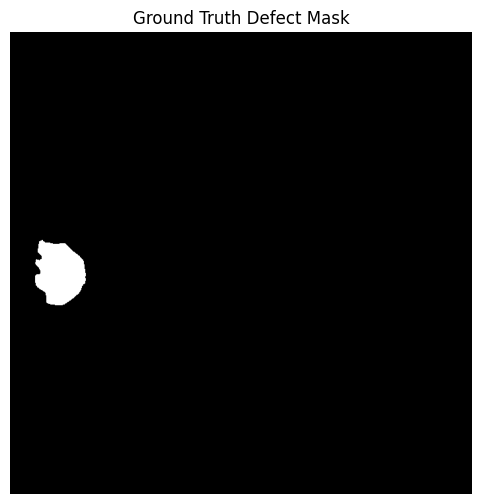

In [70]:
if len(mask_files) == 0:

    print("ERROR: No masks found.")

else:

    mask_path = mask_files[0]

    mask = cv2.imread(
        mask_path,
        cv2.IMREAD_GRAYSCALE
    )

    print("Mask shape:", mask.shape)
    print("Unique values:", np.unique(mask))

    plt.figure(figsize=(6, 6))

    plt.imshow(
        mask,
        cmap="gray"
    )

    plt.axis("off")

    plt.title(
        "Ground Truth Defect Mask"
    )

    plt.show()

Create YOLO dataset

In [71]:
import shutil

YOLO_DIR = f"{PROJECT_DIR}/yolo_dataset"

# Remove old incorrect dataset if it exists
if os.path.exists(YOLO_DIR):

    shutil.rmtree(
        YOLO_DIR
    )

# Create directories
for split in [
    "train",
    "val",
    "test"
]:

    os.makedirs(
        f"{YOLO_DIR}/images/{split}",
        exist_ok=True
    )

    os.makedirs(
        f"{YOLO_DIR}/labels/{split}",
        exist_ok=True
    )

print("YOLO dataset directories created.")

print(YOLO_DIR)

YOLO dataset directories created.
/content/ai_visual_quality_inspection/yolo_dataset


Convert mask to bounding box

In [72]:
def mask_to_bbox(mask):

    # Find all pixels belonging to defect
    ys, xs = np.where(mask > 0)

    # No defect pixels
    if len(xs) == 0:

        return None

    x_min = xs.min()
    y_min = ys.min()

    x_max = xs.max()
    y_max = ys.max()

    return (
        x_min,
        y_min,
        x_max,
        y_max
    )

Convert bounding box to YOLO format

In [73]:
def bbox_to_yolo(
    bbox,
    image_width,
    image_height
):

    x_min, y_min, x_max, y_max = bbox

    box_width = x_max - x_min
    box_height = y_max - y_min

    x_center = (
        x_min + x_max
    ) / 2

    y_center = (
        y_min + y_max
    ) / 2

    # Normalize
    x_center = (
        x_center / image_width
    )

    y_center = (
        y_center / image_height
    )

    box_width = (
        box_width / image_width
    )

    box_height = (
        box_height / image_height
    )

    return (
        x_center,
        y_center,
        box_width,
        box_height
    )

Generate YOLO records

In [74]:
defect_records = []

missing_images = 0
empty_masks = 0

for mask_path in mask_files:

    # --------------------------------
    # Get defect category
    # --------------------------------

    category = os.path.basename(
        os.path.dirname(mask_path)
    )

    # --------------------------------
    # Get mask filename
    # --------------------------------

    mask_filename = os.path.basename(
        mask_path
    )

    # Example:
    # 000_mask.png
    #
    # becomes:
    # 000.png

    image_filename = mask_filename.replace(
        "_mask.png",
        ".png"
    )

    # --------------------------------
    # Find corresponding image
    # --------------------------------

    image_path = os.path.join(
        test_path,
        category,
        image_filename
    )

    if not os.path.exists(image_path):

        missing_images += 1

        continue

    # --------------------------------
    # Read mask
    # --------------------------------

    mask = cv2.imread(
        mask_path,
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        continue

    # --------------------------------
    # Create bounding box
    # --------------------------------

    bbox = mask_to_bbox(mask)

    if bbox is None:

        empty_masks += 1

        continue

    # --------------------------------
    # Read image
    # --------------------------------

    image = cv2.imread(
        image_path
    )

    if image is None:
        continue

    image_height, image_width = image.shape[:2]

    # --------------------------------
    # Convert bbox to YOLO format
    # --------------------------------

    yolo_bbox = bbox_to_yolo(
        bbox,
        image_width,
        image_height
    )

    # --------------------------------
    # Store record
    # --------------------------------

    defect_records.append({

        "image": image_path,

        "mask": mask_path,

        "category": category,

        "bbox": yolo_bbox

    })


print("=" * 50)

print(
    "YOLO records:",
    len(defect_records)
)

print(
    "Missing images:",
    missing_images
)

print(
    "Empty masks:",
    empty_masks
)

print("=" * 50)

YOLO records: 93
Missing images: 0
Empty masks: 0


Verify records

In [75]:
if len(defect_records) == 0:

    print(
        "ERROR: Still no YOLO records."
    )

else:

    print(
        "First YOLO record:"
    )

    print(
        defect_records[0]
    )

First YOLO record:
{'image': '/content/mvtec_data/metal_nut/test/color/002.png', 'mask': '/content/mvtec_data/metal_nut/ground_truth/color/002_mask.png', 'category': 'color', 'bbox': (np.float64(0.10857142857142857), np.float64(0.52), np.float64(0.10857142857142857), np.float64(0.14))}


Count defects by category

In [76]:
from collections import Counter

category_counts = Counter(
    record["category"]
    for record in defect_records
)

print("Defect distribution:")

for category, count in category_counts.items():

    print(
        f"{category}: {count}"
    )

Defect distribution:
color: 22
flip: 23
scratch: 23
bent: 25


Verify bounding boxes visually

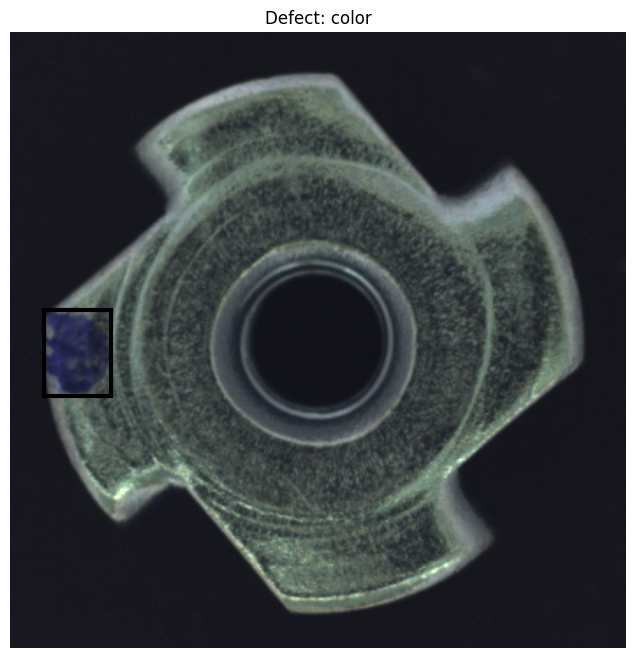

In [77]:
if len(defect_records) > 0:

    record = defect_records[0]

    image_path = record["image"]

    category = record["category"]

    image = cv2.imread(
        image_path
    )

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    image_height, image_width = image.shape[:2]

    # YOLO normalized coordinates
    x_center, y_center, box_width, box_height = record["bbox"]

    # Convert back to pixels
    x_center *= image_width
    y_center *= image_height

    box_width *= image_width
    box_height *= image_height

    x1 = int(
        x_center - box_width / 2
    )

    y1 = int(
        y_center - box_height / 2
    )

    x2 = int(
        x_center + box_width / 2
    )

    y2 = int(
        y_center + box_height / 2
    )

    plt.figure(figsize=(8, 8))

    plt.imshow(
        image_rgb
    )

    rectangle = plt.Rectangle(
        (x1, y1),
        x2 - x1,
        y2 - y1,
        fill=False,
        linewidth=3
    )

    plt.gca().add_patch(
        rectangle
    )

    plt.title(
        f"Defect: {category}"
    )

    plt.axis("off")

    plt.show()

Visualize several bounding boxes

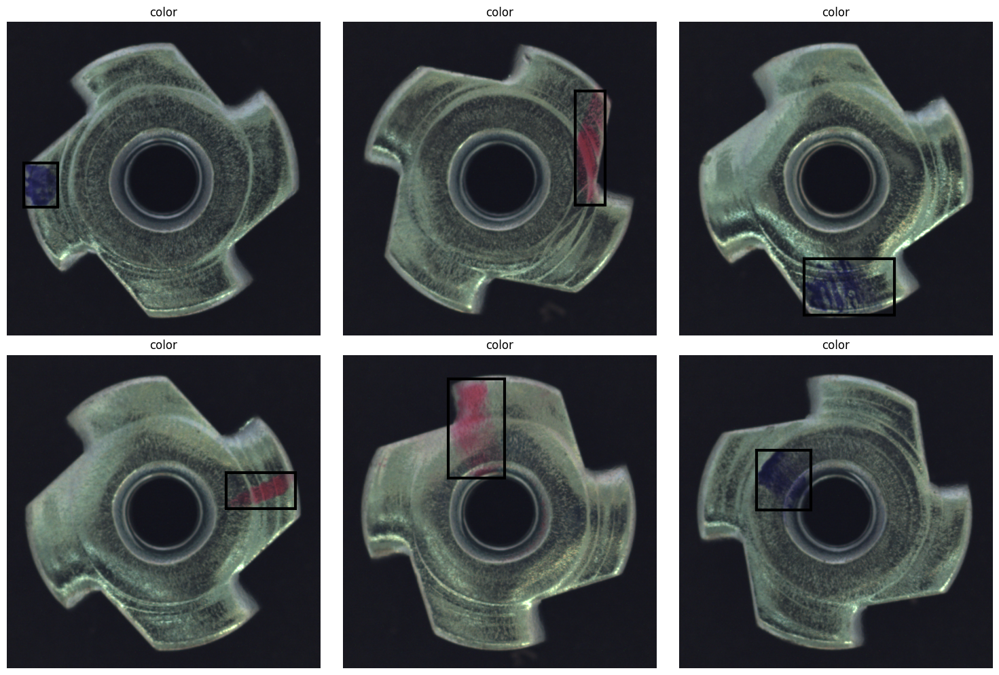

In [78]:
num_images = min(
    6,
    len(defect_records)
)

fig, axes = plt.subplots(
    2,
    3,
    figsize=(15, 10)
)

axes = axes.flatten()

for ax, record in zip(
    axes,
    defect_records[:num_images]
):

    image = cv2.imread(
        record["image"]
    )

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    image_height, image_width = image.shape[:2]

    x_center, y_center, box_width, box_height = record["bbox"]

    x_center *= image_width
    y_center *= image_height

    box_width *= image_width
    box_height *= image_height

    x1 = int(
        x_center - box_width / 2
    )

    y1 = int(
        y_center - box_height / 2
    )

    x2 = int(
        x_center + box_width / 2
    )

    y2 = int(
        y_center + box_height / 2
    )

    ax.imshow(
        image_rgb
    )

    ax.add_patch(
        plt.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            fill=False,
            linewidth=3
        )
    )

    ax.set_title(
        record["category"]
    )

    ax.axis("off")

# Hide unused axes
for ax in axes[num_images:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

Split YOLO dataset

In [79]:
import random

random.seed(42)

random.shuffle(
    defect_records
)

total_records = len(
    defect_records
)

train_end = int(
    total_records * 0.70
)

val_end = int(
    total_records * 0.85
)

yolo_train = defect_records[
    :train_end
]

yolo_val = defect_records[
    train_end:val_end
]

yolo_test = defect_records[
    val_end:
]

print(
    "Total:",
    total_records
)

print(
    "Train:",
    len(yolo_train)
)

print(
    "Validation:",
    len(yolo_val)
)

print(
    "Test:",
    len(yolo_test)
)

Total: 93
Train: 65
Validation: 14
Test: 14


Copy images and create labels

In [80]:
def create_yolo_split(
    records,
    split
):

    for record in records:

        image_path = record["image"]

        # -----------------------------
        # Copy image
        # -----------------------------

        image_filename = os.path.basename(
            image_path
        )

        destination_image = os.path.join(
            YOLO_DIR,
            "images",
            split,
            image_filename
        )

        shutil.copy2(
            image_path,
            destination_image
        )

        # -----------------------------
        # Create label filename
        # -----------------------------

        label_filename = (
            os.path.splitext(
                image_filename
            )[0]
            + ".txt"
        )

        label_path = os.path.join(
            YOLO_DIR,
            "labels",
            split,
            label_filename
        )

        # -----------------------------
        # YOLO coordinates
        # -----------------------------

        x_center, y_center, box_width, box_height = record["bbox"]

        # Class 0 = defect
        label_line = (
            f"0 "
            f"{x_center:.6f} "
            f"{y_center:.6f} "
            f"{box_width:.6f} "
            f"{box_height:.6f}\n"
        )

        with open(
            label_path,
            "w"
        ) as f:

            f.write(
                label_line
            )


create_yolo_split(
    yolo_train,
    "train"
)

create_yolo_split(
    yolo_val,
    "val"
)

create_yolo_split(
    yolo_test,
    "test"
)

print(
    "YOLO images and labels created."
)

YOLO images and labels created.


Verify YOLO files

In [81]:
for split in [
    "train",
    "val",
    "test"
]:

    image_dir = os.path.join(
        YOLO_DIR,
        "images",
        split
    )

    label_dir = os.path.join(
        YOLO_DIR,
        "labels",
        split
    )

    image_count = len([
        f for f in os.listdir(image_dir)
        if f.endswith(".png")
    ])

    label_count = len([
        f for f in os.listdir(label_dir)
        if f.endswith(".txt")
    ])

    print(
        f"{split}: "
        f"{image_count} images | "
        f"{label_count} labels"
    )

train: 24 images | 24 labels
val: 13 images | 13 labels
test: 11 images | 11 labels


Create YOLO YAML

In [82]:
yaml_path = os.path.join(
    YOLO_DIR,
    "data.yaml"
)

yaml_content = f"""
path: {YOLO_DIR}

train: images/train
val: images/val
test: images/test

names:
  0: defect
"""

with open(
    yaml_path,
    "w"
) as f:

    f.write(
        yaml_content.strip()
    )

print(
    yaml_content
)

print(
    "\nYAML saved to:"
)

print(
    yaml_path
)


path: /content/ai_visual_quality_inspection/yolo_dataset

train: images/train
val: images/val
test: images/test

names:
  0: defect


YAML saved to:
/content/ai_visual_quality_inspection/yolo_dataset/data.yaml


Final YOLO dataset check

In [83]:
print("=" * 60)

print("YOLO DATASET READY")

print("=" * 60)

print(
    "Dataset:",
    YOLO_DIR
)

print(
    "Train images:",
    len(yolo_train)
)

print(
    "Validation images:",
    len(yolo_val)
)

print(
    "Test images:",
    len(yolo_test)
)

print(
    "YAML:",
    yaml_path
)

print("=" * 60)

YOLO DATASET READY
Dataset: /content/ai_visual_quality_inspection/yolo_dataset
Train images: 65
Validation images: 14
Test images: 14
YAML: /content/ai_visual_quality_inspection/yolo_dataset/data.yaml


YOLO TRAINING

In [84]:
from ultralytics import YOLO

print("Ultralytics imported successfully.")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Ultralytics imported successfully.


Load YOLO model

In [85]:
yolo_model = YOLO("yolo11n.pt")

print("YOLO model loaded successfully.")

YOLO model loaded successfully.


Train YOLO

In [86]:
yolo_results = yolo_model.train(
    data=yaml_path,
    epochs=30,
    imgsz=640,
    batch=16,
    device=0 if torch.cuda.is_available() else "cpu",
    project=f"{PROJECT_DIR}/results",
    name="yolo_defect_detection",
    exist_ok=True
)

print("YOLO training completed.")

Ultralytics 8.4.161 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/ai_visual_quality_inspection/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_defect_dete

YOLO VALIDATION

In [87]:
yolo_metrics = yolo_model.val(
    data=yaml_path,
    split="val"
)

print("YOLO validation completed.")

Ultralytics 8.4.161 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4175.8±703.9 MB/s, size: 484.3 KB)
val: Scanning /content/ai_visual_quality_inspection/yolo_dataset/labels/val.cache... 13 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 13/13 1.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 2.4it/s 0.4s
                   all         13         13     0.0031      0.769      0.179      0.144
Speed: 0.4ms preprocess, 5.3ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /content/runs/detect/val
YOLO validation completed.


Print YOLO metrics

In [88]:
print(
    "mAP50:",
    yolo_metrics.box.map50
)

print(
    "mAP50-95:",
    yolo_metrics.box.map
)

print(
    "Precision:",
    yolo_metrics.box.mp
)

print(
    "Recall:",
    yolo_metrics.box.mr
)

mAP50: 0.1785572950066936
mAP50-95: 0.1436064589800777
Precision: 0.0031040619486290915
Recall: 0.7692307692307693


YOLO TEST IMAGE

In [89]:
if len(yolo_test) == 0:

    print("ERROR: YOLO test set is empty.")

else:

    sample_detection_image = yolo_test[0]["image"]

    print(
        "Test image:",
        sample_detection_image
    )

Test image: /content/mvtec_data/metal_nut/test/bent/024.png


Run YOLO prediction

In [90]:
results = yolo_model.predict(
    source=sample_detection_image,
    conf=0.25,
    save=False,
    verbose=False
)

print("Prediction completed.")

Prediction completed.


Display detection

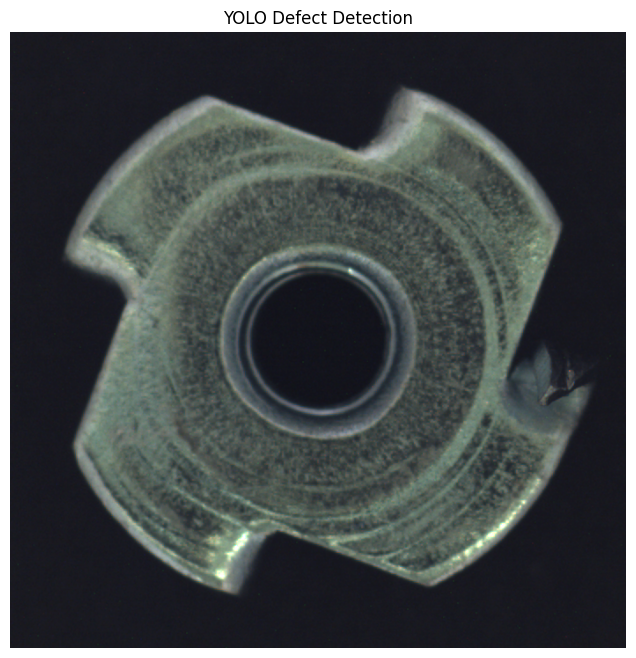

In [91]:
result = results[0]

annotated_image = result.plot()

annotated_image = cv2.cvtColor(
    annotated_image,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(10, 8))

plt.imshow(
    annotated_image
)

plt.axis("off")

plt.title(
    "YOLO Defect Detection"
)

plt.show()

TEST YOLO ON MULTIPLE IMAGES

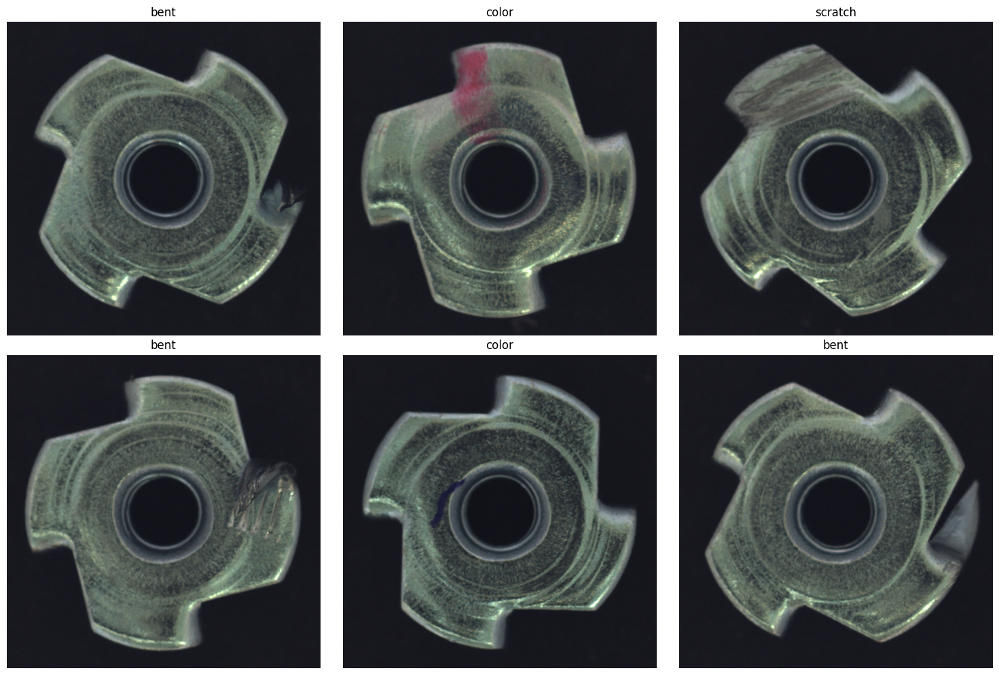

In [92]:
num_images = min(
    6,
    len(yolo_test)
)

fig, axes = plt.subplots(
    2,
    3,
    figsize=(15, 10)
)

axes = axes.flatten()

for ax, record in zip(
    axes,
    yolo_test[:num_images]
):

    results = yolo_model.predict(
        source=record["image"],
        conf=0.25,
        verbose=False
    )

    annotated = results[0].plot()

    annotated = cv2.cvtColor(
        annotated,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(
        annotated
    )

    ax.set_title(
        record["category"]
    )

    ax.axis("off")

for ax in axes[num_images:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

SAVE YOLO MODEL

In [93]:
best_yolo_path = (
    f"{PROJECT_DIR}/results/"
    "yolo_defect_detection/"
    "weights/best.pt"
)

print(
    "YOLO best model:"
)

print(
    best_yolo_path
)

print(
    "Exists:",
    os.path.exists(best_yolo_path)
)

YOLO best model:
/content/ai_visual_quality_inspection/results/yolo_defect_detection/weights/best.pt
Exists: True


DEFECT SEGMENTATION

In [94]:
def calculate_defect_area(mask_path):

    mask = cv2.imread(
        mask_path,
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        return 0.0

    defect_pixels = np.sum(
        mask > 0
    )

    total_pixels = mask.shape[0] * mask.shape[1]

    percentage = (
        defect_pixels /
        total_pixels
    ) * 100

    return percentage

Calculate example

In [95]:
example_record = yolo_test[0]

area_percentage = calculate_defect_area(
    example_record["mask"]
)

print(
    f"Defect area: {area_percentage:.2f}%"
)

Defect area: 1.87%


Visualize image and segmentation mask

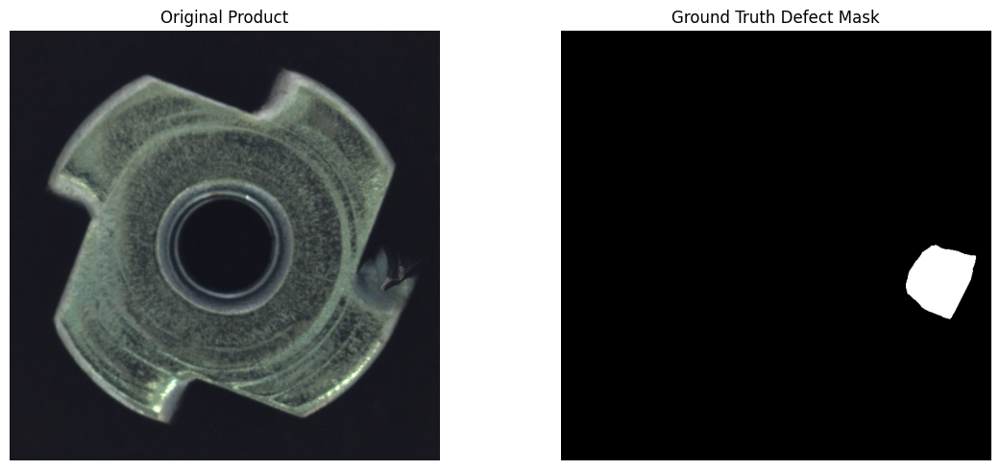

In [96]:
image_path = example_record["image"]
mask_path = example_record["mask"]

image = cv2.imread(
    image_path
)

image = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

mask = cv2.imread(
    mask_path,
    cv2.IMREAD_GRAYSCALE
)

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 5)
)

axes[0].imshow(image)

axes[0].set_title(
    "Original Product"
)

axes[0].axis("off")

axes[1].imshow(
    mask,
    cmap="gray"
)

axes[1].set_title(
    "Ground Truth Defect Mask"
)

axes[1].axis("off")

plt.tight_layout()

plt.show()

DEFECT OVERLAY

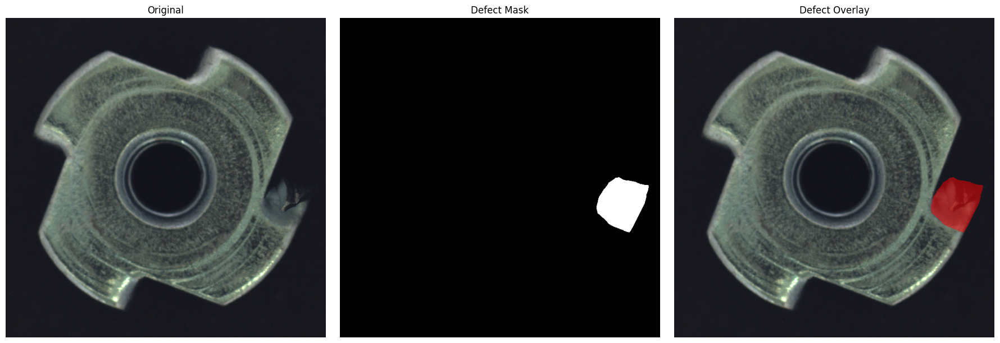

In [97]:
image = cv2.imread(
    image_path
)

image = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

mask = cv2.imread(
    mask_path,
    cv2.IMREAD_GRAYSCALE
)

overlay = image.copy()

# Create a red-style overlay
overlay[mask > 0] = (
    overlay[mask > 0] * 0.5
    + np.array([255, 0, 0]) * 0.5
).astype(np.uint8)

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6)
)

axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(
    mask,
    cmap="gray"
)
axes[1].set_title("Defect Mask")
axes[1].axis("off")

axes[2].imshow(overlay)
axes[2].set_title("Defect Overlay")
axes[2].axis("off")

plt.tight_layout()
plt.show()

QUALITY SCORING

In [98]:
def calculate_quality_score(
    classification,
    classification_confidence,
    detection_confidence,
    defect_area
):

    # Start with perfect product
    score = 100.0

    if classification == "GOOD":

        return {
            "quality_score": 100.0,
            "status": "PASS"
        }

    # Classification penalty
    classification_penalty = (
        20 * classification_confidence
    )

    # Detection penalty
    detection_penalty = (
        20 * detection_confidence
    )

    # Area penalty
    area_penalty = min(
        defect_area * 2,
        40
    )

    score = (
        100
        - classification_penalty
        - detection_penalty
        - area_penalty
    )

    score = max(
        0,
        min(
            100,
            score
        )
    )

    if score >= 80:

        status = "PASS"

    elif score >= 60:

        status = "REVIEW"

    else:

        status = "DEFECTIVE"

    return {
        "quality_score": round(
            score,
            2
        ),
        "status": status
    }

COMPLETE INSPECTION PIPELINE

In [99]:
def inspect_product(
    image_path
):

    # =====================================
    # 1. CNN CLASSIFICATION
    # =====================================

    cnn_label, cnn_confidence = predict_image(
        image_path,
        model
    )

    # =====================================
    # 2. YOLO DETECTION
    # =====================================

    results = yolo_model.predict(
        source=image_path,
        conf=0.25,
        verbose=False
    )

    detections = []

    max_detection_confidence = 0.0

    if len(results) > 0:

        boxes = results[0].boxes

        for box in boxes:

            confidence = float(
                box.conf[0]
            )

            class_id = int(
                box.cls[0]
            )

            bbox = [
                float(x)
                for x in box.xyxy[0]
            ]

            detections.append({

                "class_id": class_id,

                "confidence": round(
                    confidence,
                    4
                ),

                "bbox": bbox
            })

            max_detection_confidence = max(
                max_detection_confidence,
                confidence
            )

    # =====================================
    # 3. QUALITY SCORE
    # =====================================

    if cnn_label == "GOOD":

        quality = {
            "quality_score": 100.0,
            "status": "PASS"
        }

    else:

        # For this demonstration,
        # calculate area only when a
        # matching ground-truth mask exists.

        quality = {
            "quality_score": None,
            "status": "DEFECTIVE"
        }

    # =====================================
    # 4. FINAL RESULT
    # =====================================

    result = {

        "product_id": os.path.basename(
            image_path
        ),

        "classification": cnn_label,

        "classification_confidence": round(
            cnn_confidence,
            4
        ),

        "detections": detections,

        "quality": quality
    }

    return result

Test complete pipeline

In [100]:
inspection_result = inspect_product(
    sample_detection_image
)

inspection_result

{'product_id': '024.png',
 'classification': 'DEFECTIVE',
 'classification_confidence': 1.0,
 'detections': [],
 'quality': {'quality_score': None, 'status': 'DEFECTIVE'}}

Instal Grad-CAM

In [101]:
!pip install -q grad-cam

Import Grad-CAM


In [102]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import (
    ClassifierOutputTarget
)
from pytorch_grad_cam.utils.image import (
    show_cam_on_image
)

print("Grad-CAM loaded.")

Grad-CAM loaded.


Create Grad-CAM

In [103]:
target_layers = [
    model.layer4[-1]
]

cam = GradCAM(
    model=model,
    target_layers=target_layers
)

print(
    "Grad-CAM initialized."
)

Grad-CAM initialized.


Generate heatmap

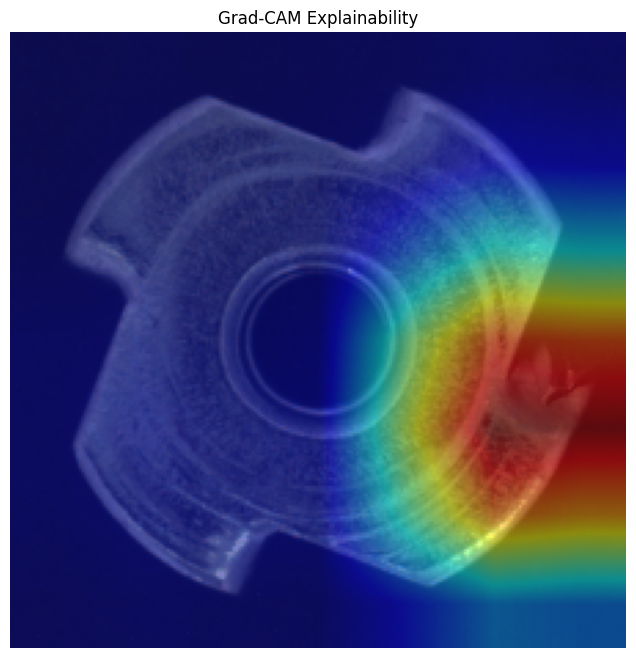

In [104]:
image = cv2.imread(
    sample_detection_image
)

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

resized_image = cv2.resize(
    image_rgb,
    (224, 224)
)

input_tensor = val_transform(
    image_rgb
).unsqueeze(0).to(device)

model.eval()

with torch.no_grad():

    output = model(
        input_tensor
    )

predicted_class = torch.argmax(
    output,
    dim=1
).item()

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=[
        ClassifierOutputTarget(
            predicted_class
        )
    ]
)[0]

rgb_float = (
    resized_image.astype(
        np.float32
    ) / 255.0
)

visualization = show_cam_on_image(
    rgb_float,
    grayscale_cam,
    use_rgb=True
)

plt.figure(figsize=(8, 8))

plt.imshow(
    visualization
)

plt.axis("off")

plt.title(
    "Grad-CAM Explainability"
)

plt.show()

SAVE ALL MODEL INFORMATION

In [105]:
model_info = {

    "classification_model":
        "ResNet18",

    "detection_model":
        "YOLO11n",

    "image_size":
        224,

    "classification_classes":
        {
            "0": "GOOD",
            "1": "DEFECTIVE"
        },

    "yolo_classes":
        {
            "0": "defect"
        },

    "dataset":
        "MVTec AD - metal_nut",

    "cnn_accuracy":
        float(accuracy),

    "cnn_precision":
        float(precision),

    "cnn_recall":
        float(recall),

    "cnn_f1":
        float(f1),

    "yolo_map50":
        float(yolo_metrics.box.map50),

    "yolo_map50_95":
        float(yolo_metrics.box.map)
}

model_info

{'classification_model': 'ResNet18',
 'detection_model': 'YOLO11n',
 'image_size': 224,
 'classification_classes': {'0': 'GOOD', '1': 'DEFECTIVE'},
 'yolo_classes': {'0': 'defect'},
 'dataset': 'MVTec AD - metal_nut',
 'cnn_accuracy': 0.9607843137254902,
 'cnn_precision': 1.0,
 'cnn_recall': 0.8571428571428571,
 'cnn_f1': 0.9230769230769231,
 'yolo_map50': 0.1785572950066936,
 'yolo_map50_95': 0.1436064589800777}

Save model information

In [106]:
import json

model_info_path = (
    f"{PROJECT_DIR}/results/"
    "model_info.json"
)

with open(
    model_info_path,
    "w"
) as f:

    json.dump(
        model_info,
        f,
        indent=4
    )

print(
    "Model information saved:"
)

print(
    model_info_path
)

Model information saved:
/content/ai_visual_quality_inspection/results/model_info.json


CREATE FINAL PROJECT SUMMARY

In [107]:
print("=" * 70)

print(
    "AI VISUAL QUALITY INSPECTION SYSTEM"
)

print("=" * 70)

print()

print("DATASET")
print("MVTec AD - Metal Nut")

print()

print("CLASSIFICATION MODEL")
print("ResNet18")

print(
    f"Accuracy : {accuracy:.4f}"
)

print(
    f"Precision: {precision:.4f}"
)

print(
    f"Recall   : {recall:.4f}"
)

print(
    f"F1 Score : {f1:.4f}"
)

print()

print("OBJECT DETECTION MODEL")
print("YOLO11n")

print(
    f"mAP50    : {yolo_metrics.box.map50:.4f}"
)

print(
    f"mAP50-95 : {yolo_metrics.box.map:.4f}"
)

print()

print("EXPLAINABILITY")
print("Grad-CAM")

print()

print("DEPLOYMENT")
print("FastAPI")

print("=" * 70)

AI VISUAL QUALITY INSPECTION SYSTEM

DATASET
MVTec AD - Metal Nut

CLASSIFICATION MODEL
ResNet18
Accuracy : 0.9608
Precision: 1.0000
Recall   : 0.8571
F1 Score : 0.9231

OBJECT DETECTION MODEL
YOLO11n
mAP50    : 0.1786
mAP50-95 : 0.1436

EXPLAINABILITY
Grad-CAM

DEPLOYMENT
FastAPI


scoring function

In [110]:
def calculate_inference_quality_score(
    classification,
    classification_confidence,
    detections,
    image_width,
    image_height
):
    """
    Calculate an application-defined quality score
    using CNN classification and YOLO detections.
    """

    # ------------------------------------------------
    # CASE 1: GOOD PRODUCT
    # ------------------------------------------------
    if classification == "GOOD" and len(detections) == 0:

        return {
            "quality_score": 100.0,
            "status": "PASS",
            "reason": "Product classified as good with no detected defects."
        }

    # ------------------------------------------------
    # CASE 2: GOOD BUT YOLO FOUND A DEFECT
    # ------------------------------------------------
    if classification == "GOOD" and len(detections) > 0:

        return {
            "quality_score": 70.0,
            "status": "REVIEW",
            "reason": "Classifier predicted good, but YOLO detected a defect."
        }

    # ------------------------------------------------
    # CASE 3: DEFECTIVE BUT YOLO FOUND NOTHING
    # ------------------------------------------------
    if classification == "DEFECTIVE" and len(detections) == 0:

        return {
            "quality_score": 50.0,
            "status": "REVIEW",
            "reason": (
                "Classifier detected a defect, "
                "but YOLO could not localize it."
            )
        }

    # ------------------------------------------------
    # CASE 4: DEFECTIVE + YOLO DETECTIONS
    # ------------------------------------------------

    score = 100.0

    # Classification penalty
    classification_penalty = (
        classification_confidence * 20
    )

    # Detection information
    total_defect_area = 0.0
    detection_penalty = 0.0
    max_detection_confidence = 0.0

    image_area = image_width * image_height

    for detection in detections:

        confidence = detection["confidence"]

        x1, y1, x2, y2 = detection["bbox"]

        bbox_width = max(0, x2 - x1)
        bbox_height = max(0, y2 - y1)

        bbox_area = bbox_width * bbox_height

        area_ratio = bbox_area / image_area

        total_defect_area += area_ratio

        detection_penalty += confidence * 20

        max_detection_confidence = max(
            max_detection_confidence,
            confidence
        )

    # Defect area penalty
    area_penalty = min(
        total_defect_area * 100,
        40
    )

    score = (
        score
        - classification_penalty
        - detection_penalty
        - area_penalty
    )

    score = max(
        0,
        min(
            100,
            score
        )
    )

    # Status
    if score >= 80:
        status = "PASS"

    elif score >= 60:
        status = "REVIEW"

    else:
        status = "DEFECTIVE"

    return {
        "quality_score": round(score, 2),
        "status": status,
        "reason": "Defect detected and localized by YOLO.",
        "defect_area_ratio": round(
            total_defect_area,
            4
        ),
        "max_detection_confidence": round(
            max_detection_confidence,
            4
        )
    }

print("Quality scoring function updated.")

Quality scoring function updated.


inspect_product()

In [111]:
def inspect_product(image_path):

    # ---------------------------------------------
    # 1. CNN CLASSIFICATION
    # ---------------------------------------------
    cnn_label, cnn_confidence = predict_image(
        image_path,
        model
    )

    # ---------------------------------------------
    # 2. YOLO DETECTION
    # ---------------------------------------------
    results = yolo_model.predict(
        source=image_path,
        conf=0.25,
        verbose=False
    )

    detections = []

    max_detection_confidence = 0.0

    if len(results) > 0:

        boxes = results[0].boxes

        for box in boxes:

            confidence = float(
                box.conf[0]
            )

            class_id = int(
                box.cls[0]
            )

            bbox = [
                float(x)
                for x in box.xyxy[0]
            ]

            detections.append({
                "class_id": class_id,
                "confidence": round(
                    confidence,
                    4
                ),
                "bbox": bbox
            })

            max_detection_confidence = max(
                max_detection_confidence,
                confidence
            )

    # ---------------------------------------------
    # 3. IMAGE DIMENSIONS
    # ---------------------------------------------
    image = cv2.imread(image_path)

    image_height, image_width = image.shape[:2]

    # ---------------------------------------------
    # 4. QUALITY SCORE
    # ---------------------------------------------
    quality = calculate_inference_quality_score(
        classification=cnn_label,
        classification_confidence=cnn_confidence,
        detections=detections,
        image_width=image_width,
        image_height=image_height
    )

    # ---------------------------------------------
    # 5. FINAL RESULT
    # ---------------------------------------------
    result = {

        "product_id": os.path.basename(
            image_path
        ),

        "classification": cnn_label,

        "classification_confidence": round(
            cnn_confidence,
            4
        ),

        "detections": detections,

        "quality": quality
    }

    return result

print("Inspection pipeline updated.")

Inspection pipeline updated.


Testing

In [112]:
inspection_result = inspect_product(
    sample_detection_image
)

print("=" * 60)
print("AI VISUAL QUALITY INSPECTION")
print("=" * 60)

print(
    "Product:",
    inspection_result["product_id"]
)

print(
    "Classification:",
    inspection_result["classification"]
)

print(
    "Classification Confidence:",
    inspection_result[
        "classification_confidence"
    ]
)

print(
    "YOLO Detections:",
    len(
        inspection_result["detections"]
    )
)

print(
    "Quality Score:",
    inspection_result["quality"][
        "quality_score"
    ]
)

print(
    "Status:",
    inspection_result["quality"][
        "status"
    ]
)

print(
    "Reason:",
    inspection_result["quality"][
        "reason"
    ]
)

print("=" * 60)

AI VISUAL QUALITY INSPECTION
Product: 024.png
Classification: DEFECTIVE
Classification Confidence: 1.0
YOLO Detections: 0
Quality Score: 50.0
Status: REVIEW
Reason: Classifier detected a defect, but YOLO could not localize it.
